# Proyek Klasifikasi Gambar: Skin Type
# ID Tim : CC25-CF206
# Nama Anggota Tim :

1. (ML) MC009D5Y0882 - Fadilah Kurniawan Hadi - Universitas Gunadarma - [Aktif]
2. (ML) MC009D5X2047 - Jessica Theresia - Universitas Gunadarma - [Aktif]
3. (ML) MC009D5Y0456 - Masahiro Gerarudo Yamazaki - Universitas Gunadarma - [Aktif]
4. (FEBE) FC009D5X2440 - Fadiah Ahmad - Universitas Gunadarma - [Aktif]
5. (FEBE) FC009D5Y0572 - Galih Bayu Pamungkas - Universitas Gunadarma - [Aktif]
6. (FEBE) FC009D5X1075 - Ni Gusti Ayu Mutiara Indriyani - Universitas Gunadarma - [Aktif]


## Import Semua Packages/Library yang Digunakan

In [ ]:
# !pip install tensorflowjs

In [ ]:
# !pip install scikit-image

In [ ]:
# !pip install opencv-python-headless

In [ ]:
# !pip install gdown

In [ ]:
import gdown
import zipfile
import os
import random
import shutil
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import files
import cv2
from PIL import Image, ImageEnhance
from tqdm import tqdm
from skimage import img_as_ubyte
from skimage.transform import rotate, AffineTransform, warp
from skimage.exposure import adjust_gamma
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.utils import Sequence
from sklearn.utils import shuffle
from tensorflow.keras.regularizers import l2
import math

## Data Preparation

### Data Loading

In [ ]:
file_id = "1xntQo79-wZFBu0Cj5csY1rZu2lZ1xli_"
output = "dataset skintype.zip"

gdown.download(f"https://drive.google.com/uc?id={file_id}", output, quiet=False)

# Ekstrak file ZIP
extract_dir = "skin_data"
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# Set path hasil ekstraksi
EXTRACTED_PATH = os.path.join(os.getcwd(), extract_dir)

Downloading...
From: https://drive.google.com/uc?id=1xntQo79-wZFBu0Cj5csY1rZu2lZ1xli_
To: /content/dataset skintype.zip
100%|██████████| 16.2M/16.2M [00:00<00:00, 39.2MB/s]


#### Dataset Checking

Dataset terdiri dari data tiga jenis tipe kulit yang berbeda yaitu oily, dry dan normal yang dibuat sendiri dengan mengumpulkan sample dari beberap sumber dataset, yaitu :
1. https://www.kaggle.com/datasets/rajeshpandhare/skin-classification-normal-acne-oily-dry-wrinkle
2. https://www.kaggle.com/datasets/kepinn69/new-dataset-skinai
3. https://www.kaggle.com/datasets/shakyadissanayake/oily-dry-and-normal-skin-types-dataset
4. https://www.kaggle.com/datasets/ritikasinghkatoch/normaldryoily-skin-type
5. https://www.kaggle.com/datasets/shakyadissanayake/oily-dry-and-normal-skin-types-dataset

Dataset terdiri dari total 290 gambar dengan sepesifikasi masing - masing folder:
1. Oily 104 gambar
2. Dry 100 gambar
3. Normal 86 gambar

In [ ]:
subdirs = [d for d in os.listdir(EXTRACTED_PATH) if os.path.isdir(os.path.join(EXTRACTED_PATH, d))]
if len(subdirs) == 1:
    EXTRACTED_PATH = os.path.join(EXTRACTED_PATH, subdirs[0])

classes = [d for d in os.listdir(EXTRACTED_PATH) if os.path.isdir(os.path.join(EXTRACTED_PATH, d))]
print("Kelas yang ditemukan:", classes)

Kelas yang ditemukan: ['normal', 'oily', 'dry']


** Menampilkan jumlah dan resolusi gambar per kelas

In [ ]:
def print_images_resolution(directory):
    total_images = 0

    for subdir in os.listdir(directory):
        subdir_path = os.path.join(directory, subdir)
        if not os.path.isdir(subdir_path):
            continue

        image_files = [f for f in os.listdir(subdir_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        unique_sizes = set()
        num_images = len(image_files)
        print(f"\n{subdir}: {num_images} gambar")
        total_images += num_images

        for img_file in image_files:
            img_path = os.path.join(subdir_path, img_file)
            try:
                with Image.open(img_path) as img:
                    unique_sizes.add(img.size)
            except:
                print(f"Gagal membaca gambar: {img_file}")

        for size in unique_sizes:
            print(f"- Resolusi: {size}")
        print("---------------")

In [ ]:
print_images_resolution(EXTRACTED_PATH)


normal: 86 gambar
- Resolusi: (287, 358)
- Resolusi: (568, 710)
- Resolusi: (267, 334)
- Resolusi: (350, 350)
- Resolusi: (612, 502)
- Resolusi: (336, 421)
- Resolusi: (216, 270)
- Resolusi: (520, 520)
- Resolusi: (498, 547)
- Resolusi: (640, 640)
- Resolusi: (477, 640)
- Resolusi: (433, 433)
- Resolusi: (342, 342)
- Resolusi: (422, 396)
- Resolusi: (478, 422)
- Resolusi: (563, 640)
- Resolusi: (447, 447)
- Resolusi: (209, 261)
- Resolusi: (232, 290)
- Resolusi: (355, 443)
- Resolusi: (324, 324)
- Resolusi: (334, 417)
- Resolusi: (379, 382)
- Resolusi: (236, 330)
- Resolusi: (394, 492)
- Resolusi: (577, 577)
- Resolusi: (183, 275)
- Resolusi: (336, 420)
- Resolusi: (218, 272)
- Resolusi: (215, 194)
- Resolusi: (256, 320)
- Resolusi: (380, 380)
- Resolusi: (494, 640)
- Resolusi: (640, 422)
- Resolusi: (653, 816)
- Resolusi: (486, 608)
- Resolusi: (436, 546)
- Resolusi: (432, 768)
- Resolusi: (211, 211)
- Resolusi: (445, 445)
- Resolusi: (519, 519)
- Resolusi: (422, 422)
- Resolusi: (64

Dataset preview

In [ ]:
def show_dataset_samples(base_path, classes, samples_per_class=5):
    plt.figure(figsize=(samples_per_class * 2.2, len(classes) * 2.5))

    for row_idx, cls in enumerate(classes):
        class_path = os.path.join(base_path, cls)
        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        selected_images = random.sample(images, min(samples_per_class, len(images)))

        for col_idx, img_name in enumerate(selected_images):
            img_path = os.path.join(class_path, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (128, 128))

            idx = row_idx * samples_per_class + col_idx + 1
            plt.subplot(len(classes), samples_per_class, idx)
            plt.imshow(img)
            plt.axis('off')

            # Tampilkan nama kelas di kolom pertama
            if col_idx == 0:
                plt.title(cls, fontsize=10, loc='left', pad=10)

    plt.suptitle("Contoh Gambar per Kelas", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()

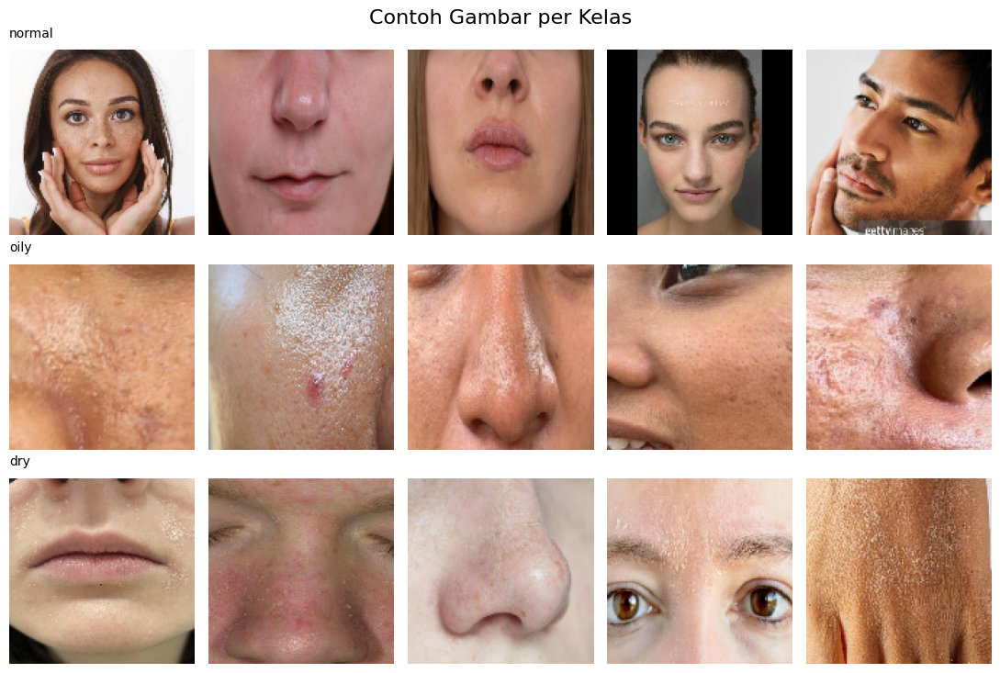

In [ ]:
show_dataset_samples(EXTRACTED_PATH, classes, samples_per_class=5)

#### Plot Distribusi Data

In [ ]:
# Hitung jumlah gambar per kelas
class_counts = {}
for cls in classes:
    class_path = os.path.join(EXTRACTED_PATH, cls)
    images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    class_counts[cls] = len(images)

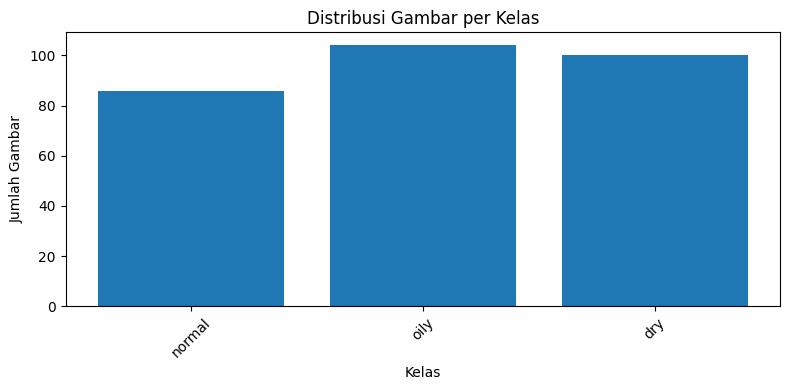

In [ ]:
plt.figure(figsize=(8, 4))
plt.bar(class_counts.keys(), class_counts.values())
plt.title("Distribusi Gambar per Kelas")
plt.xlabel("Kelas")
plt.ylabel("Jumlah Gambar")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**INSIGHT DATA PREPARATION**

1. Dapat dilihat bahwa setiap kelas memiliki jumlah yang tidak imbang serta resolusi gambar yang tidak seragam.
2. Oleh karena itu, diperlukan proses oversampling untuk menyeimbangkan jumlah masing masing kelas.
3. Lalu resize dan augmentasi yang lebih menampilkan tekstur dari masing - masing tipe kulit agar model dapat mengenali pola dengan lebih baik serta menghindari bias selama pelatihan.

### Data Preprocessing

#### Data Oversampling

Dilakukan augmentasi dengan menyamakan jumlah masing-masing kelas menjadi 300 gambar sehingga total dataset menjadi 900 gambar. Langkah ini dilakukan sebelum proses selanjutnya untuk memastikan data evaluasi tidak terlalu sedikit saat dilakukan split, sehingga cukup untuk proses pengujian.

In [ ]:
# Parameter
AUGMENTED_PATH = '/content/Dataset_Skin_Type/overSampling_dataset'
IMAGES_PER_CLASS = 300
TARGET_SIZE = (224, 224)

In [ ]:
# Transformasi sederhana per kelas (bisa ditambah)
def get_class_transformations(cls):
    return [lambda img: cv2.GaussianBlur(img, (3, 3), 0)]

# Fungsi oversampling
def oversample_class(cls, src, dst, images, total_original, target_count=IMAGES_PER_CLASS):
    oversampled_count = 0
    transformation_pool = get_class_transformations(cls)

    for i in tqdm(range(target_count - total_original), desc=f"Oversampling {cls}"):
        img = cv2.imread(os.path.join(src, random.choice(images)))
        if img is None:
            continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        for _ in range(random.randint(1, 2)):
            transform = random.choice(transformation_pool)
            img_rgb = transform(img_rgb)

        out = np.array(img_rgb, dtype=np.uint8)
        out_bgr = cv2.cvtColor(out, cv2.COLOR_RGB2BGR)
        cv2.imwrite(os.path.join(dst, f"os_{i+1}.jpg"), out_bgr)
        oversampled_count += 1

    return oversampled_count

# Fungsi utama augment + oversampling
def augment_and_oversample():
    os.makedirs(AUGMENTED_PATH, exist_ok=True)
    classes = [cls for cls in os.listdir(EXTRACTED_PATH) if os.path.isdir(os.path.join(EXTRACTED_PATH, cls))]

    print("...Proses augmentasi (salin) dan oversampling...\n")

    for cls in classes:
        print(f"Kelas: {cls}")
        src = os.path.join(EXTRACTED_PATH, cls)
        dst = os.path.join(AUGMENTED_PATH, cls)
        os.makedirs(dst, exist_ok=True)

        images = [f for f in os.listdir(src) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        total_original = len(images)

        # ✅ Salin semua gambar asli ke dst
        for f in images:
            shutil.copy2(os.path.join(src, f), os.path.join(dst, f))

        # ✅ Oversampling jika perlu
        oversampled_count = 0
        if total_original < IMAGES_PER_CLASS:
            oversampled_count = oversample_class(cls, src, dst, images, total_original)

        print(f"{cls} - Asli: {total_original}, Oversampling: {oversampled_count}\n")

    print("Proses augmentasi dan oversampling selesai!")

augment_and_oversample()

...Proses augmentasi (salin) dan oversampling...

Kelas: normal


Oversampling normal: 100%|██████████| 214/214 [00:01<00:00, 188.75it/s]


normal - Asli: 86, Oversampling: 214

Kelas: oily


Oversampling oily: 100%|██████████| 196/196 [00:01<00:00, 131.89it/s]


oily - Asli: 104, Oversampling: 196

Kelas: dry


Oversampling dry: 100%|██████████| 200/200 [00:01<00:00, 177.92it/s]

dry - Asli: 100, Oversampling: 200

Proses augmentasi dan oversampling selesai!


#### Splitting Data

Parameter **val_ratio=0.2** digunakan untuk membagi dataset menjadi dua bagian, yaitu 80% untuk data pelatihan (training) dan 20% untuk data validasi (validation). Rasio ini sudah cukup untuk memberikan gambaran performa model selama proses pelatihan tanpa mengorbankan terlalu banyak data latih.

In [ ]:
SPLIT_PATH = '/content/Dataset_Skin_Type/split_dataset'
TRAIN_SPLIT = os.path.join(SPLIT_PATH, 'train')
VALID_SPLIT = os.path.join(SPLIT_PATH, 'validation')

os.makedirs(TRAIN_SPLIT, exist_ok=True)
os.makedirs(VALID_SPLIT, exist_ok=True)

val_ratio = 0.2

classes = [cls for cls in os.listdir(AUGMENTED_PATH) if os.path.isdir(os.path.join(AUGMENTED_PATH, cls))]

for cls in classes:
    src_dir = os.path.join(AUGMENTED_PATH, cls)
    train_cls_dir = os.path.join(TRAIN_SPLIT, cls)
    valid_cls_dir = os.path.join(VALID_SPLIT, cls)

    os.makedirs(train_cls_dir, exist_ok=True)
    os.makedirs(valid_cls_dir, exist_ok=True)

    all_files = [f for f in os.listdir(src_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    train_files, valid_files = train_test_split(all_files, test_size=val_ratio, random_state=42, shuffle=True)

    for f in train_files:
        shutil.copy2(os.path.join(src_dir, f), os.path.join(train_cls_dir, f))

    for f in valid_files:
        shutil.copy2(os.path.join(src_dir, f), os.path.join(valid_cls_dir, f))

print("✅ Splitting data selesai")

✅ Splitting data selesai


In [ ]:
zip_filename = "/content/split_dataset.zip"
folder_to_zip = SPLIT_PATH

def zip_folder(folder_path, zip_path):
    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, _, files in os.walk(folder_path):
            for file in files:
                abs_path = os.path.join(root, file)
                rel_path = os.path.relpath(abs_path, folder_path)
                zipf.write(abs_path, rel_path)

zip_folder(folder_to_zip, zip_filename)
print(f"✅ Folder berhasil di-zip: {zip_filename}")

✅ Folder berhasil di-zip: /content/split_dataset.zip


#### Image Data Generator

Pada tahap ini, dilakukan proses augmentasi dengan image generator khusus dengan menggunakan custom data generator bernama RGBGrayGenerator. Tujuan dari metode ini adalah untuk meningkatkan kemampuan model dalam mengenali tekstur kulit dengan menggabungkan informasi warna (RGB) dan intensitas pencahayaan (Grayscale).

Generator ini bekerja dengan cara membaca citra dari direktori dataset, lalu memproses setiap gambar menjadi format 4 channel, yaitu:

- 3 channel RGB: merepresentasikan warna alami dari gambar.
- 1 channel Grayscale: merepresentasikan tingkat kecerahan atau intensitas piksel, yang seringkali memperjelas detail tekstur seperti pori-pori, garis halus, atau ketidakteraturan permukaan kulit.

Setiap gambar dikonversi dari format BGR (default OpenCV) ke RGB, lalu dikonversi ke grayscale menggunakan cv2.cvtColor. Grayscale ini kemudian ditambahkan sebagai channel keempat, membentuk tensor gambar berukuran (height, width, 4). Gambar-gambar ini kemudian dinormalisasi ke rentang [0, 1] dengan membagi nilai piksel dengan 255.

Dengan pendekatan ini, model akan mendapatkan dua perspektif informasi sekaligus:
- Dari RGB: warna kulit, pigmentasi, dan warna dominan.
- Dari Grayscale: tekstur permukaan, pola kerutan, ketebalan kulit, dan kekasaran.

Hal ini sangat penting untuk klasifikasi tipe kulit, di mana variasi warna bisa membingungkan, namun tekstur tetap konsisten antar kelas.


In [ ]:
class RGBGrayGenerator(Sequence):
    def __init__(self, directory, batch_size=32, target_size=(224, 224), shuffle_data=True):
        self.directory = directory
        self.batch_size = batch_size
        self.target_size = target_size
        self.shuffle_data = shuffle_data
        self.classes = sorted(os.listdir(directory))
        self.class_indices = {cls_name: idx for idx, cls_name in enumerate(self.classes)}
        self.filepaths, self.labels = self._load_dataset()
        self.on_epoch_end()

    def _load_dataset(self):
        filepaths = []
        labels = []
        for idx, cls in enumerate(self.classes):
            cls_path = os.path.join(self.directory, cls)
            for fname in os.listdir(cls_path):
                if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                    filepaths.append(os.path.join(cls_path, fname))
                    labels.append(idx)
        return filepaths, labels

    def __len__(self):
        return int(np.ceil(len(self.filepaths) / self.batch_size))

    def __getitem__(self, idx):
        batch_paths = self.filepaths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_labels = self.labels[idx * self.batch_size:(idx + 1) * self.batch_size]

        batch_images = np.zeros((len(batch_paths), *self.target_size, 4), dtype=np.float32)
        for i, path in enumerate(batch_paths):
            img = cv2.imread(path)
            img = cv2.resize(img, self.target_size)
            rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
            gray = np.expand_dims(gray, axis=-1)
            combined = np.concatenate((rgb, gray), axis=-1) / 255.0
            batch_images[i] = combined

        return batch_images, tf.keras.utils.to_categorical(batch_labels, num_classes=len(self.classes))

    def on_epoch_end(self):
        if self.shuffle_data:
            self.filepaths, self.labels = shuffle(self.filepaths, self.labels, random_state=42)

In [ ]:
train_dir = '/content/Dataset_Skin_Type/split_dataset/train'
val_dir = '/content/Dataset_Skin_Type/split_dataset/validation'

batch_size = 32
input_shape = (224, 224, 4)
TARGET_SIZE = (224,224)

train_generator = RGBGrayGenerator(train_dir, batch_size=batch_size, target_size=TARGET_SIZE)
validation_generator = RGBGrayGenerator(val_dir, batch_size=batch_size, target_size=TARGET_SIZE, shuffle_data=False)

** Hasil Data Image Generator

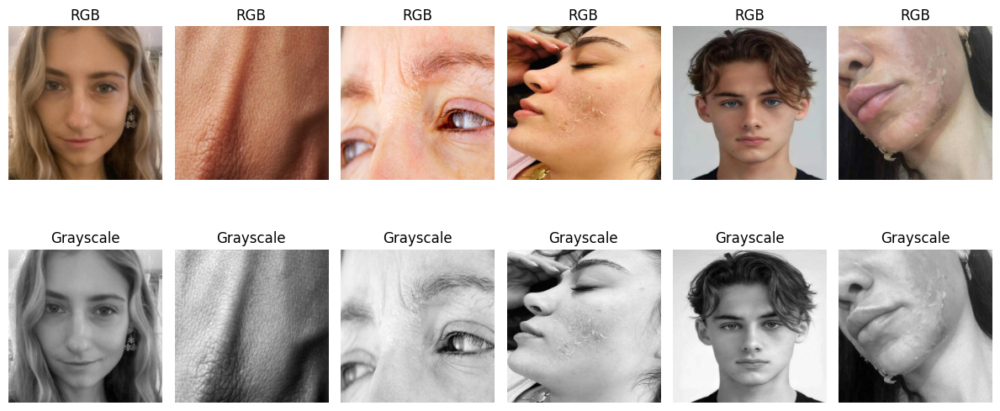

In [ ]:
images, labels = train_generator[0]

num_samples = 6
plt.figure(figsize=(12, 6))

for i in range(num_samples):
    rgb = images[i][:, :, :3]
    gray = images[i][:, :, 3]

    # RGB
    plt.subplot(2, num_samples, i + 1)
    plt.imshow(rgb)
    plt.title("RGB")
    plt.axis("off")

    # Grayscale
    plt.subplot(2, num_samples, i + 1 + num_samples)
    plt.imshow(gray, cmap='gray')
    plt.title("Grayscale")
    plt.axis("off")

plt.tight_layout()
plt.show()

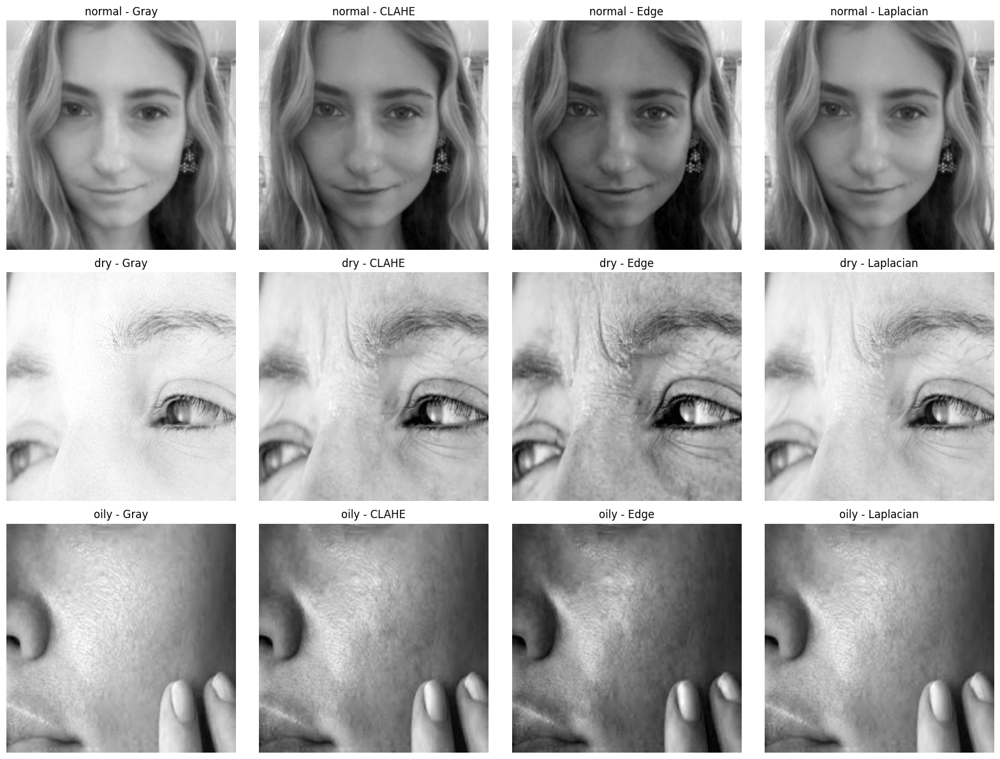

In [ ]:
# Ambil 1 batch dari generator
x_batch, y_batch = train_generator[0]
class_names = train_generator.classes

# 1 contoh dari tiap kelas
shown_labels = []
shown_indices = []

for i in range(len(y_batch)):
    label_idx = np.argmax(y_batch[i])
    if label_idx not in shown_labels:
        shown_labels.append(label_idx)
        shown_indices.append(i)
    if len(shown_labels) == len(class_names):
        break

# Plot hasil preprocessing: grayscale, clahe, edge, laplacian
plt.figure(figsize=(16, 4 * len(shown_indices)))
for i, idx in enumerate(shown_indices):
    img = x_batch[idx]  # (224, 224, 4)
    label = class_names[np.argmax(y_batch[idx])]

    gray = img[:, :, 0]
    clahe = img[:, :, 1]
    edge = img[:, :, 2]
    laplacian = img[:, :, 3]

    plt.subplot(len(shown_indices), 4, i * 4 + 1)
    plt.imshow(gray, cmap='gray')
    plt.title(f"{label} - Gray")
    plt.axis('off')

    plt.subplot(len(shown_indices), 4, i * 4 + 2)
    plt.imshow(clahe, cmap='gray')
    plt.title(f"{label} - CLAHE")
    plt.axis('off')

    plt.subplot(len(shown_indices), 4, i * 4 + 3)
    plt.imshow(edge, cmap='gray')
    plt.title(f"{label} - Edge")
    plt.axis('off')

    plt.subplot(len(shown_indices), 4, i * 4 + 4)
    plt.imshow(laplacian, cmap='gray')
    plt.title(f"{label} - Laplacian")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
print("Labels mapping :", train_generator.class_indices)

Labels mapping : {'dry': 0, 'normal': 1, 'oily': 2}


In [ ]:
label_idx = np.argmax(labels[0])
label_name = train_generator.classes[label_idx]
print("Label gambar pertama:", label_name)

Label gambar pertama: normal


## Modelling (PURE CNN FIX)

Model ini merupakan arsitektur CNN (Convolutional Neural Network) dengan input shape (224, 224, 4) yang mencakup RGB + Grayscale channel. Model terdiri dari:

3 blok Conv2D berukuran kernel (3x3) dengan jumlah filter bertingkat (32 → 64 → 128), diikuti:

- Aktivasi ReLU untuk non-linearitas,
- Dropout bertingkat (0.2 → 0.3 → 0.4) untuk regularisasi,
- MaxPooling2D (2x2) untuk reduksi dimensi spasial.

Setelah itu, hasil flatten dari feature map masuk ke:

- Dense(256) dengan ReLU,
- Dropout(0.5),
- Dense(3) dengan Softmax sebagai output 3 kelas.

Model dikompilasi :

- Optimizer Adam (learning_rate=1e-3),
- Loss categorical_crossentropy (karena output multi-class),
- Metric evaluasi accuracy.

Training :

- EarlyStopping untuk menghentikan pelatihan jika val_loss tidak membaik dalam 5 epoch,
- class_weight untuk mengatasi ketidakseimbangan jumlah data per kelas,

Validasi dilakukan menggunakan generator validasi selama maksimum 30 epoch.

In [ ]:
# label integer dari train_generator
labels = train_generator.classes

# kelas adalah array integer unik
unique_classes = np.unique(labels)

# Hitung class weight
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=unique_classes,
    y=labels
)

# Konversi ke dictionary
class_weight_dict = dict(zip(unique_classes, class_weights))

print("Class Weights:", class_weight_dict)


Class Weights: {np.str_('dry'): np.float64(1.0), np.str_('normal'): np.float64(1.0), np.str_('oily'): np.float64(1.0)}


In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), input_shape=(224, 224, 4)),
    Activation('relu'),
    Dropout(0.2),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3)),
    Activation('relu'),
    Dropout(0.3),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3)),
    Activation('relu'),
    Dropout(0.4),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │         1,184 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 222, 222, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 222, 222, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 109, 109, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 109, 109, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 52, 52, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 52, 52, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    22,151,424 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,245,731 (84.86 MB)

 Trainable params: 22,245,731 (84.86 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=[early_stop],
    class_weight=class_weight_dict
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 25s 604ms/step - accuracy: 0.4039 - loss: 4.8162 - val_accuracy: 0.6000 - val_loss: 1.0410
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.5861 - loss: 0.9482 - val_accuracy: 0.6944 - val_loss: 0.8337
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 187ms/step - accuracy: 0.8006 - loss: 0.5606 - val_accuracy: 0.8333 - val_loss: 0.5465
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - accuracy: 0.8848 - loss: 0.3070 - val_accuracy: 0.9278 - val_loss: 0.5189
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 173ms/step - accuracy: 0.9335 - loss: 0.2376 - val_accuracy: 0.9556 - val_loss: 0.3493
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - accuracy: 0.9693 - loss: 0.1773 - val_accuracy: 0.9722 - val_loss: 0.2469
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.9667 - loss: 0.1462 - val_accuracy: 0.9667 - val_loss: 0.2820
Epoch 8/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - accuracy: 0.9636 - loss: 0.1749 - val_accuracy: 0

## Evaluasi dan Visualisasi

In [ ]:
# Akurasi training dan validation dari hasil training
train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]

# Evaluasi pada data testing (val_gen)
test_loss, test_acc = model.evaluate(validation_generator, verbose=1)

print(f"\nHasil Akurasi Model:")
print(f"Training Accuracy   : {train_acc * 100:.2f}%")
print(f"Validation Accuracy : {val_acc * 100:.2f}%")
print(f"Testing Accuracy    : {test_acc * 100:.2f}%")

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9932 - loss: 0.0876

Hasil Akurasi Model:
Training Accuracy   : 99.58%
Validation Accuracy : 98.33%
Testing Accuracy    : 98.33%


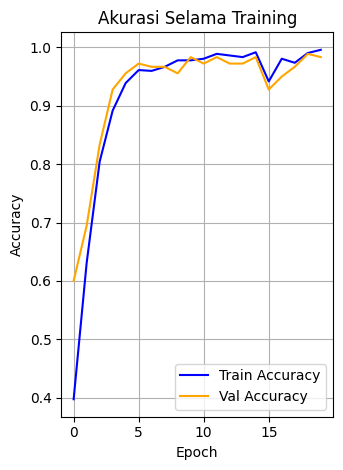

In [ ]:
# Plot akurasi
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy', color='blue')
plt.plot(history.history['val_accuracy'], label='Val Accuracy', color='orange')
plt.title('Akurasi Selama Training')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

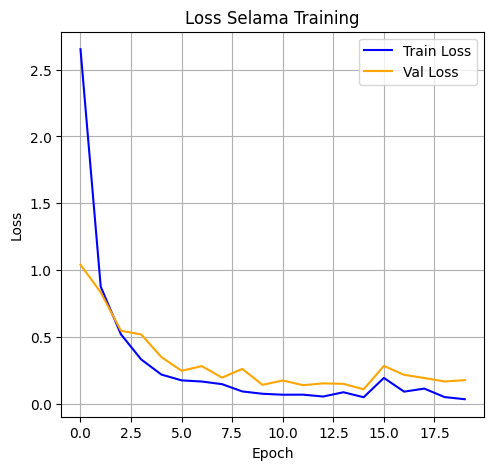

In [ ]:
# plost loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss', color='blue')
plt.plot(history.history['val_loss'], label='Val Loss', color='orange')
plt.title('Loss Selama Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

In [ ]:
# 1. Prediksi label dari generator validasi
y_pred_probs = model.predict(validation_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# 2. Label ground truth
y_true = np.array(validation_generator.labels)

# 3. Mapping label ke nama kelas
label_map = {i: cls for i, cls in enumerate(validation_generator.classes)}
class_names = validation_generator.classes  # atau pakai: sorted(os.listdir(val_dir))

# 4. Classification Report
print("\n📋 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step

📋 Classification Report:
              precision    recall  f1-score   support

         dry       0.98      1.00      0.99        60
      normal       0.97      1.00      0.98        60
        oily       1.00      0.95      0.97        60

    accuracy                           0.98       180
   macro avg       0.98      0.98      0.98       180
weighted avg       0.98      0.98      0.98       180



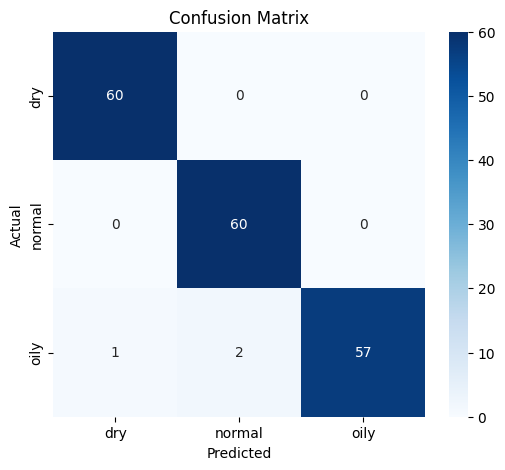

In [ ]:
# 5. Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names,
            yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

**INSIGHT**

1. Akurasi :

  Ketiga akurasi (training, validation, testing) berada pada rentang yang hampir identik, menunjukkan bahwa model:

  - Generalize dengan baik ke data yang belum pernah dilihat.
  - Tidak mengalami overfitting maupun underfitting.
  - Loss juga rendah (0.0867) di akhir training, mendukung performa akurasi tinggi.

2. Grafik Akurasi (Train vs Validation)

  Grafik menunjukkan kenaikan konsisten dan sejajar antara training dan validation accuracy. Tidak ada gap mencolok antara keduanya. Kenaikan halus tanpa lonjakan tajam → learning process stabil. Kurva akurasi yang sehat ini mendukung pemilihan learning rate dan batch size yang sudah tepat.

3. Grafik Loss (Train vs Validation)

  Training loss menurun tajam dan stabil. Validation loss juga menurun seiring waktu, menunjukkan bahwa generalisasi membaik. Tidak ada tanda-tanda val loss naik ketika train loss turun → ini mengindikasikan tidak terjadi overfitting berat. Hal ini menandakan strategi regularisasi, augmentasi, dan/atau pemilihan arsitektur model berjalan efektif.

In [ ]:
model.save("skin_type_model.h5")

## Testing

#### Testing wajah random

Saving WhatsApp Image 2025-06-06 at 17.03.18_016bd64f.jpg to WhatsApp Image 2025-06-06 at 17.03.18_016bd64f (1).jpg
Saving WhatsApp Image 2025-06-06 at 17.02.29_a2f9531b.jpg to WhatsApp Image 2025-06-06 at 17.02.29_a2f9531b (1).jpg
Saving WhatsApp Image 2025-06-06 at 16.59.36_a27d339c.jpg to WhatsApp Image 2025-06-06 at 16.59.36_a27d339c.jpg
Saving WhatsApp Image 2025-06-06 at 13.38.26_802c110d.jpg to WhatsApp Image 2025-06-06 at 13.38.26_802c110d.jpg
Saving WhatsApp Image 2025-06-06 at 13.38.30_f91c5674.jpg to WhatsApp Image 2025-06-06 at 13.38.30_f91c5674.jpg
Saving WhatsApp Image 2025-06-06 at 13.38.27_dc596dad.jpg to WhatsApp Image 2025-06-06 at 13.38.27_dc596dad.jpg
Saving WhatsApp Image 2025-06-06 at 13.38.29_58cca8ac.jpg to WhatsApp Image 2025-06-06 at 13.38.29_58cca8ac.jpg
Saving WhatsApp Image 2025-06-06 at 13.38.29_838310d4.jpg to WhatsApp Image 2025-06-06 at 13.38.29_838310d4.jpg
Saving WhatsApp Image 2025-06-06 at 13.38.27_7a387c44.jpg to WhatsApp Image 2025-06-06 at 13.38.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━

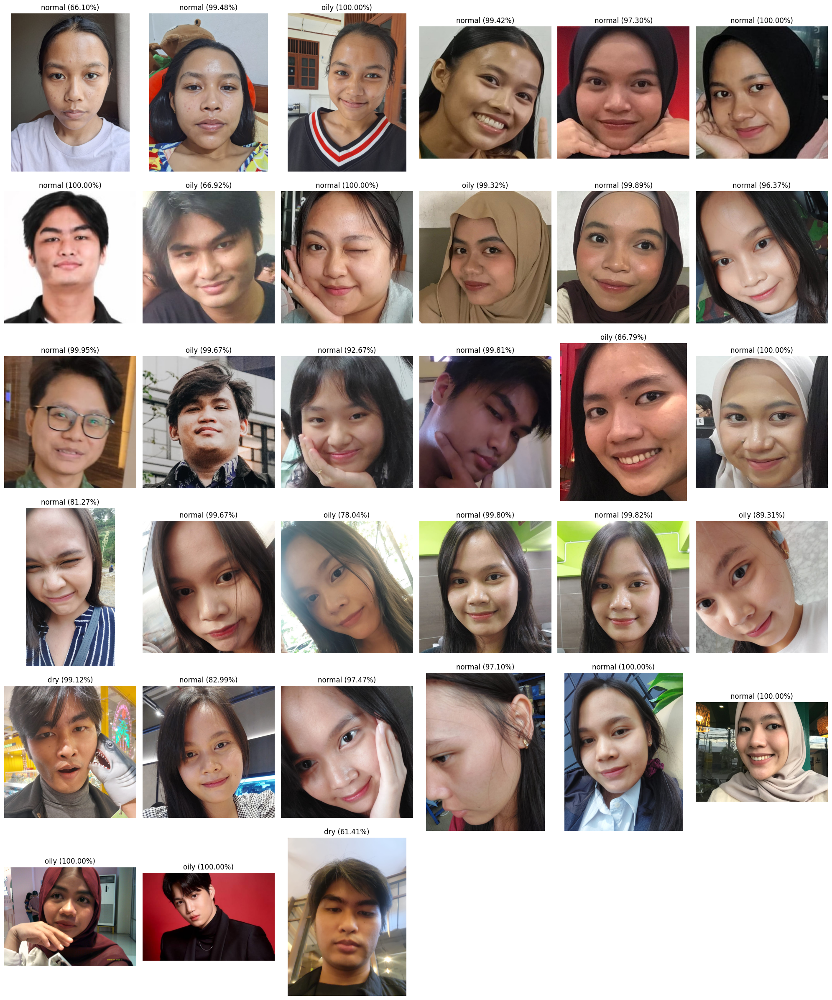

Gambar 1:
- dry: 0.26%
- normal: 66.10%
- oily: 33.65%

Gambar 2:
- dry: 0.00%
- normal: 99.48%
- oily: 0.52%

Gambar 3:
- dry: 0.00%
- normal: 0.00%
- oily: 100.00%

Gambar 4:
- dry: 0.00%
- normal: 99.42%
- oily: 0.58%

Gambar 5:
- dry: 0.84%
- normal: 97.30%
- oily: 1.86%

Gambar 6:
- dry: 0.00%
- normal: 100.00%
- oily: 0.00%

Gambar 7:
- dry: 0.00%
- normal: 100.00%
- oily: 0.00%

Gambar 8:
- dry: 0.79%
- normal: 32.29%
- oily: 66.92%

Gambar 9:
- dry: 0.00%
- normal: 100.00%
- oily: 0.00%

Gambar 10:
- dry: 0.16%
- normal: 0.53%
- oily: 99.32%

Gambar 11:
- dry: 0.00%
- normal: 99.89%
- oily: 0.11%

Gambar 12:
- dry: 3.61%
- normal: 96.37%
- oily: 0.02%

Gambar 13:
- dry: 0.02%
- normal: 99.95%
- oily: 0.03%

Gambar 14:
- dry: 0.00%
- normal: 0.33%
- oily: 99.67%

Gambar 15:
- dry: 0.01%
- normal: 92.67%
- oily: 7.32%

Gambar 16:
- dry: 0.09%
- normal: 99.81%
- oily: 0.10%

Gambar 17:
- dry: 5.07%
- normal: 8.14%
- oily: 86.79%

Gambar 18:
- dry: 0.00%
- normal: 100.00%
- oily: 0

In [ ]:
uploaded = files.upload()

# Load model
model = tf.keras.models.load_model('skin_type_model.h5')
class_labels = ['dry', 'normal', 'oily']

# Fungsi preprocessing 4 channel (RGB + Gray)
def preprocess_image_4ch(img_path, target_size=(224, 224)):
    img = cv2.imread(img_path)
    img = cv2.resize(img, target_size)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
    gray = np.expand_dims(gray, axis=-1)
    combined = np.concatenate((rgb, gray), axis=-1) / 255.0
    return np.expand_dims(combined, axis=0)

# Prediksi semua gambar sekaligus dan simpan hasilnya
results = []

for filename in uploaded.keys():
    input_image = preprocess_image_4ch(filename)
    prediction = model.predict(input_image)
    predicted_class = np.argmax(prediction)
    confidence = np.max(prediction)

    img_rgb = cv2.cvtColor(cv2.imread(filename), cv2.COLOR_BGR2RGB)
    results.append({
        "image": img_rgb,
        "label": class_labels[predicted_class],
        "confidence": confidence,
        "all_probs": prediction[0]
    })

# ======= TAMPILAN SEMUA DALAM GRID (6 KOLOM) =======
cols = 6
rows = math.ceil(len(results) / cols)
plt.figure(figsize=(20, 4 * rows))

for i, result in enumerate(results):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(result["image"])
    plt.title(f'{result["label"]} ({result["confidence"]*100:.2f}%)')
    plt.axis('off')

plt.tight_layout()
plt.show()

# ======= CETAK DETAIL TIAP PREDIKSI =======
for i, result in enumerate(results):
    print(f"Gambar {i+1}:")
    for idx, label in enumerate(class_labels):
        print(f"- {label}: {result['all_probs'][idx] * 100:.2f}%")
    print()

#### Testing Menggunakan Dataset

Saving dry_7.jpg to dry_7 (1).jpg
Saving oily_11.jpg to oily_11 (1).jpg
Saving oily_10.jpg to oily_10 (1).jpg
Saving oily_7.png to oily_7 (1).png
Saving oily_6.png to oily_6 (1).png
Saving oily_5.jpg to oily_5 (1).jpg
Saving oily_3.jpg to oily_3 (1).jpg
Saving oily_2.jpg to oily_2 (1).jpg
Saving oily_1.jpg to oily_1 (1).jpg
Saving normal_7.jpg to normal_7 (1).jpg
Saving normal_44.jpg to normal_44 (1).jpg
Saving normal_45.jpg to normal_45 (1).jpg
Saving normal_46.jpg to normal_46 (1).jpg
Saving normal_8.jpg to normal_8 (1).jpg
Saving oily_8.jpg to oily_8 (1).jpg
Saving oily_4.jpeg to oily_4 (1).jpeg
Saving normal_29.png to normal_29 (1).png
Saving normal_23.jpg to normal_23 (1).jpg
Saving normal_26.jpg to normal_26 (1).jpg
Saving normal_28.png to normal_28 (1).png
Saving dry_1.jpg to dry_1 (1).jpg
Saving dry_2.jpg to dry_2 (1).jpg
Saving dry_3.jpg to dry_3 (1).jpg
Saving dry_5.jpg to dry_5 (1).jpg
Saving dry_12.jpg to dry_12 (1).jpg
Saving dry_16.jpg to dry_16 (1).jpg
Saving dry_17.jpg 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━

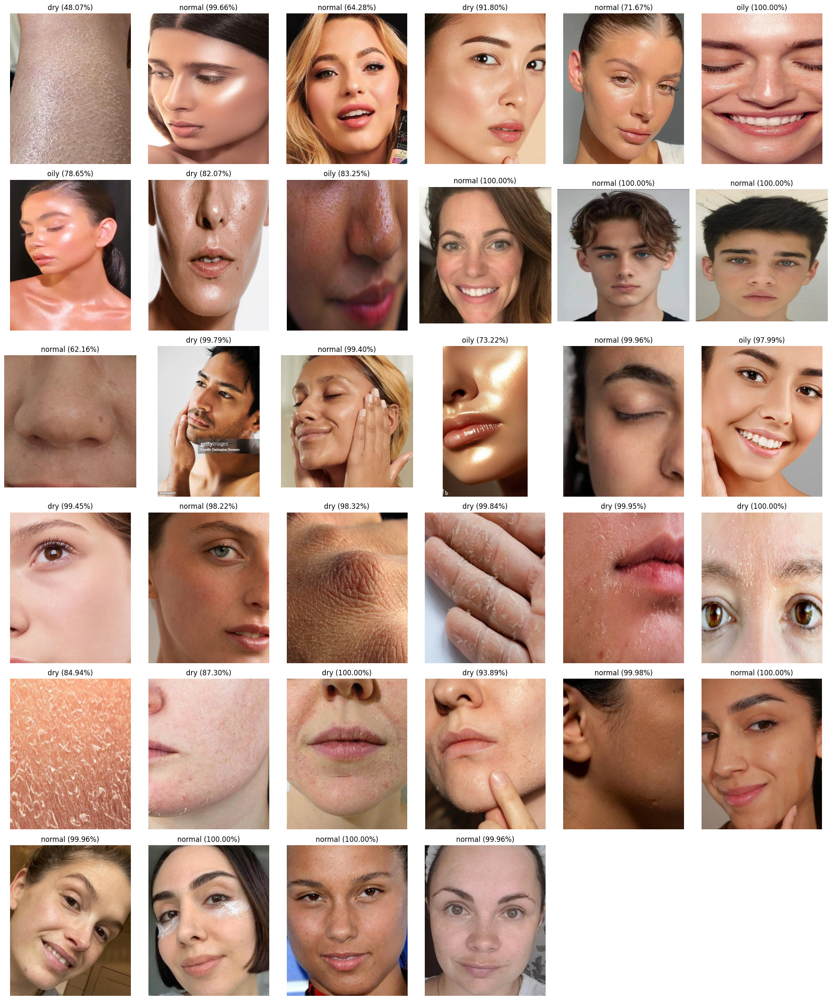

Gambar 1:
- dry: 48.07%
- normal: 25.23%
- oily: 26.70%

Gambar 2:
- dry: 0.14%
- normal: 99.66%
- oily: 0.20%

Gambar 3:
- dry: 0.82%
- normal: 64.28%
- oily: 34.89%

Gambar 4:
- dry: 91.80%
- normal: 2.71%
- oily: 5.50%

Gambar 5:
- dry: 0.00%
- normal: 71.67%
- oily: 28.33%

Gambar 6:
- dry: 0.00%
- normal: 0.00%
- oily: 100.00%

Gambar 7:
- dry: 0.00%
- normal: 21.35%
- oily: 78.65%

Gambar 8:
- dry: 82.07%
- normal: 2.26%
- oily: 15.67%

Gambar 9:
- dry: 12.93%
- normal: 3.83%
- oily: 83.25%

Gambar 10:
- dry: 0.00%
- normal: 100.00%
- oily: 0.00%

Gambar 11:
- dry: 0.00%
- normal: 100.00%
- oily: 0.00%

Gambar 12:
- dry: 0.00%
- normal: 100.00%
- oily: 0.00%

Gambar 13:
- dry: 21.17%
- normal: 62.16%
- oily: 16.68%

Gambar 14:
- dry: 99.79%
- normal: 0.16%
- oily: 0.04%

Gambar 15:
- dry: 0.21%
- normal: 99.40%
- oily: 0.39%

Gambar 16:
- dry: 26.78%
- normal: 0.00%
- oily: 73.22%

Gambar 17:
- dry: 0.02%
- normal: 99.96%
- oily: 0.02%

Gambar 18:
- dry: 1.45%
- normal: 0.56%
- o

In [ ]:
uploaded = files.upload()

# Load model
model = tf.keras.models.load_model('skin_type_model.h5')
class_labels = ['dry', 'normal', 'oily']

# Fungsi preprocessing 4 channel (RGB + Gray)
def preprocess_image_4ch(img_path, target_size=(224, 224)):
    img = cv2.imread(img_path)
    img = cv2.resize(img, target_size)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
    gray = np.expand_dims(gray, axis=-1)
    combined = np.concatenate((rgb, gray), axis=-1) / 255.0
    return np.expand_dims(combined, axis=0)

# Prediksi semua gambar sekaligus dan simpan hasilnya
results = []

for filename in uploaded.keys():
    input_image = preprocess_image_4ch(filename)
    prediction = model.predict(input_image)
    predicted_class = np.argmax(prediction)
    confidence = np.max(prediction)

    img_rgb = cv2.cvtColor(cv2.imread(filename), cv2.COLOR_BGR2RGB)
    results.append({
        "image": img_rgb,
        "label": class_labels[predicted_class],
        "confidence": confidence,
        "all_probs": prediction[0]
    })

# ======= TAMPILAN SEMUA DALAM GRID (6 KOLOM) =======
cols = 6
rows = math.ceil(len(results) / cols)
plt.figure(figsize=(20, 4 * rows))

for i, result in enumerate(results):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(result["image"])
    plt.title(f'{result["label"]} ({result["confidence"]*100:.2f}%)')
    plt.axis('off')

plt.tight_layout()
plt.show()

# ======= CETAK DETAIL TIAP PREDIKSI =======
for i, result in enumerate(results):
    print(f"Gambar {i+1}:")
    for idx, label in enumerate(class_labels):
        print(f"- {label}: {result['all_probs'][idx] * 100:.2f}%")
    print()

## Konversi & Save Model

Menyimpan model dengan 3 format ditujukan untuk backend lebih leluasa dapat memilih dan menyesuaikan stack & environment yang digunakan.

In [ ]:
model.save("skin_type_model.keras")

In [ ]:
SAVE_PATH = '/content/Models/'
model.load_weights("skin_type_model.keras")

SavedModel

In [ ]:
saved_model_path = SAVE_PATH + 'saved_model/'
tf.saved_model.save(model, saved_model_path)

MODEL TFJS

In [ ]:
pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.1 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-bigquery 3.34.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


In [ ]:
tfjs_model_path = SAVE_PATH + 'model_tfjs/'
!tensorflowjs_converter \
    --input_format=tf_saved_model \
    {saved_model_path} \
    {tfjs_model_path}

2025-06-11 01:54:19.570421: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749606859.607098    8756 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749606859.617886    8756 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
2025-06-11 01:54:29.417647: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0000 00:00:1749606869.417849    8756 gpu_device.cc:2022] Created device /job:localhost/replica:0/task

MODEL TF - LITE

In [ ]:
tflite_model_path = SAVE_PATH + 'model_tflite/model.tflite'
os.makedirs(os.path.dirname(tflite_model_path), exist_ok=True)

# Konversi model ke TFLite
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_path)
tflite_model = converter.convert()

In [ ]:
# Simpan file TFLite
with tf.io.gfile.GFile(tflite_model_path, 'wb') as f:
    f.write(tflite_model)

In [ ]:
labels_path = os.path.join(SAVE_PATH, 'model_tflite/label.txt')
with open(labels_path, 'w') as f:
    for label in classes:
        f.write(f"{label}\n")

print("Kelas yang ditemukan:", classes)

Kelas yang ditemukan: ['normal', 'oily', 'dry']


In [ ]:
print(f"Model TensorFlow Lite berhasil disimpan di {tflite_model_path}")
print(f"File label berhasil disimpan di {labels_path}")

Model TensorFlow Lite berhasil disimpan di /content/Models/model_tflite/model.tflite
File label berhasil disimpan di /content/Models/model_tflite/label.txt


### Daftar semua library Python yang diinstal di lingkungan saat ini

In [ ]:
 pip freeze requirements.txt

absl-py==1.4.0
accelerate==1.7.0
aiofiles==24.1.0
aiohappyeyeballs==2.6.1
aiohttp==3.11.15
aiosignal==1.3.2
alabaster==1.0.0
albucore==0.0.24
albumentations==2.0.8
ale-py==0.11.1
altair==5.5.0
annotated-types==0.7.0
antlr4-python3-runtime==4.9.3
anyio==4.9.0
argon2-cffi==25.1.0
argon2-cffi-bindings==21.2.0
array_record==0.7.2
arviz==0.21.0
astropy==7.1.0
astropy-iers-data==0.2025.6.2.0.38.23
astunparse==1.6.3
atpublic==5.1
attrs==25.3.0
audioread==3.0.1
autograd==1.8.0
babel==2.17.0
backcall==0.2.0
backports.tarfile==1.2.0
beautifulsoup4==4.13.4
betterproto==2.0.0b6
bigframes==2.5.0
bigquery-magics==0.9.0
bleach==6.2.0
blinker==1.9.0
blis==1.3.0
blobfile==3.0.0
blosc2==3.3.4
bokeh==3.7.3
Bottleneck==1.4.2
bqplot==0.12.45
branca==0.8.1
build==1.2.2.post1
CacheControl==0.14.3
cachetools==5.5.2
catalogue==2.0.10
certifi==2025.4.26
cffi==1.17.1
chardet==5.2.0
charset-normalizer==3.4.2
chex==0.1.89
clarabel==0.11.0
click==8.2.1
cloudpathlib==0.21.1
cloudpickle==3.1.1
cmake==3.31.6
cmdstanpy